In [4]:
#Exploratory Data Analysis
import pandas as pd
import os
import pickle
import numpy as np
import matplotlib.pyplot as plt

rootDir = 'C:/Stuff/Projects/SARP-Aerosol-ML-BrC/Data/'
rawPath = rootDir + 'Raw/SAGAMERGE/'
cleanPath = rootDir + 'Cleaned/'
processPath = rootDir + 'Processed/'
featurePath = rootDir + 'Features/'

In [5]:
df0 = pd.read_csv(cleanPath+'dataFrame0')
df1 = pd.read_csv(cleanPath+'dataFrame1')

dfList=[df0, df1]

In [6]:
df = pd.concat(dfList, ignore_index=True)

In [7]:
print(list(df))

['Unnamed: 0', 'Time_Start', 'Time_Stop', 'Day_Of_Year_YANG', 'Latitude_YANG', 'Longitude_YANG', 'MSL_GPS_Altitude_YANG', 'HAE_GPS_Altitude_YANG', 'Pressure_Altitude_YANG', 'Radar_Altitude_YANG', 'Ground_Speed_YANG', 'True_Air_Speed_YANG', 'Indicated_Air_Speed_YANG', 'Mach_Number_YANG', 'Vertical_Speed_YANG', 'True_Heading_YANG', 'Track_Angle_YANG', 'Drift_Angle_YANG', 'Pitch_Angle_YANG', 'Roll_Angle_YANG', 'Static_Air_Temp_YANG', 'Potential_Temp_YANG', 'Dew_Point_YANG', 'Total_Air_Temp_YANG', 'IR_Surf_Temp_YANG', 'Static_Pressure_YANG', 'Cabin_Pressure_YANG', 'Wind_Speed_YANG', 'Wind_Direction_YANG', 'Solar_Zenith_Angle_YANG', 'Aircraft_Sun_Elevation_YANG', 'Sun_Azimuth_YANG', 'Aircraft_Sun_Azimuth_YANG', 'Mixing_Ratio_YANG', 'Part_Press_Water_Vapor_YANG', 'Sat_Vapor_Press_H2O_YANG', 'Sat_Vapor_Press_Ice_YANG', 'Relative_Humidity_YANG', 'P_BUI', 'T_BUI', 'TAS_BUI', 'U_BUI', 'V_BUI', 'W_BUI', 'TEDR_BUI', 'REYN_BUI', 'G_LAT_BUI', 'G_LONG_BUI', 'G_ALT_BUI', 'POT_BUI', 'ROLL_BUI', 'HDG_BU

In [8]:
#sort chronologically
df = df.sort_values(by=['Day_Of_Year_YANG', 'Time_Start'], ignore_index=True)

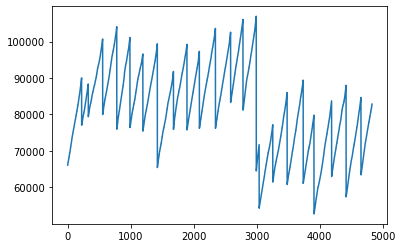

In [6]:
plt.plot(df['Time_Start'])

Text(0.5, 0, 'Day of Year')

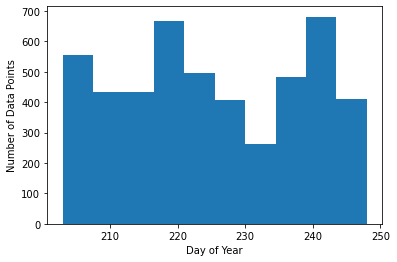

In [7]:
plt.hist(df['Day_Of_Year_YANG'],density=False)
plt.ylabel('Number of Data Points')
plt.xlabel('Day of Year')

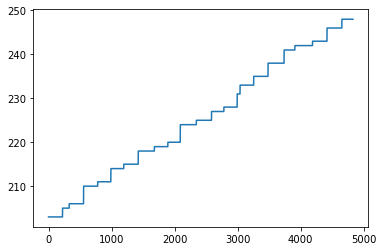

In [8]:
plt.plot(df['Day_Of_Year_YANG'])

In [9]:
print(df['fire_id_SCHWARZ'].to_string())

0            NaN
1            NaN
2            NaN
3            NaN
4            NaN
5            NaN
6            NaN
7            NaN
8            NaN
9            NaN
10           NaN
11           NaN
12           NaN
13           NaN
14           NaN
15           NaN
16           NaN
17           NaN
18           NaN
19           NaN
20           NaN
21           NaN
22           NaN
23           NaN
24           NaN
25           NaN
26           NaN
27           NaN
28           NaN
29           NaN
30           NaN
31           NaN
32           NaN
33           NaN
34           NaN
35           NaN
36           NaN
37           NaN
38           NaN
39           NaN
40           NaN
41           NaN
42           NaN
43           NaN
44           NaN
45           NaN
46           NaN
47           NaN
48           NaN
49           NaN
50           NaN
51           NaN
52           NaN
53           NaN
54           NaN
55           NaN
56           NaN
57           NaN
58           N

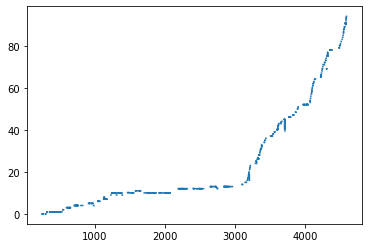

In [10]:
plt.plot(df['fire_id_SCHWARZ'])

In [11]:
absorptionDF = df[['WSAbs365_MC_WEBER', 'MSAbs365_Aero_WEBER']]

In [12]:
absorptionDF = absorptionDF.sum(axis=1)

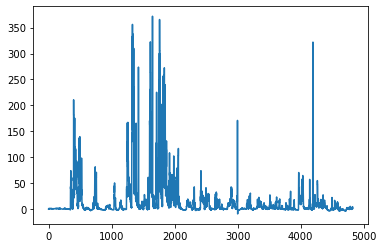

In [13]:
plt.plot(absorptionDF)

(array([2.30323463e-02, 1.72280646e-03, 5.05429025e-04, 3.04344359e-04,
        2.82605476e-04, 1.63041621e-04, 1.24998576e-04, 5.97819277e-05,
        4.34777656e-05, 2.17388828e-05]),
 array([ -9.00904 ,  29.070864,  67.150768, 105.230672, 143.310576,
        181.39048 , 219.470384, 257.550288, 295.630192, 333.710096,
        371.79    ]),
 <a list of 10 Patch objects>)

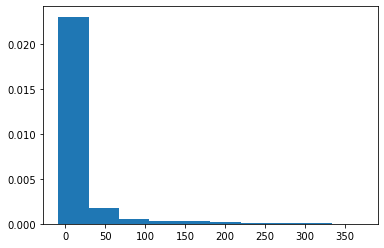

In [14]:
plt.hist(absorptionDF, density=True)

C:\Stuff\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\core.py:320: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


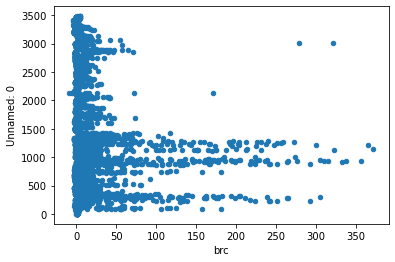

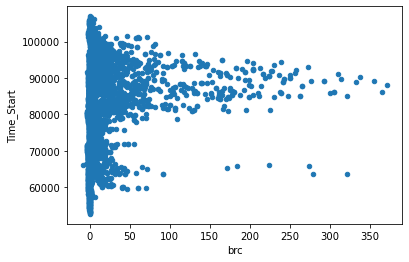

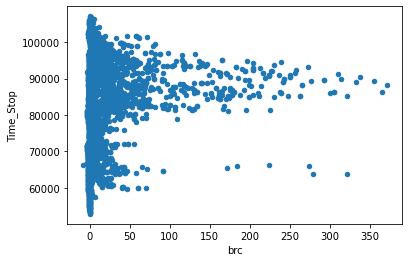

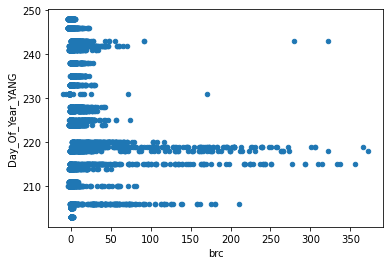

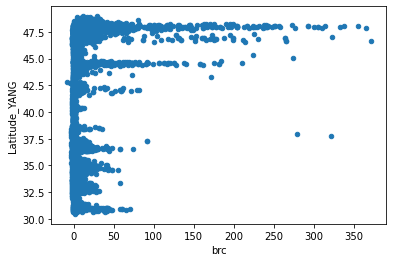

...

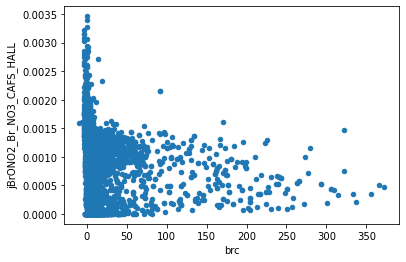

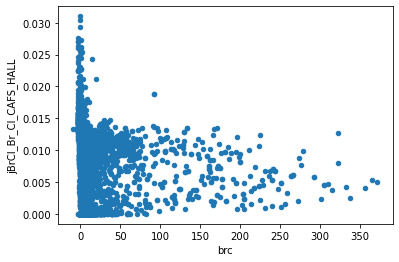

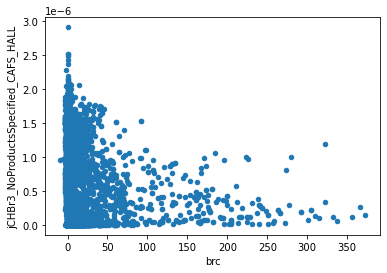

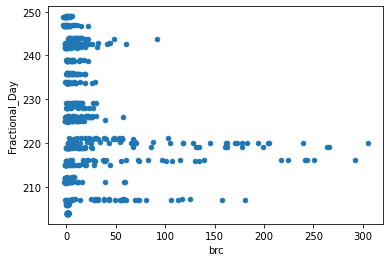

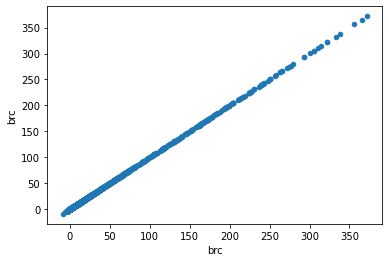

In [15]:
df['brc'] = absorptionDF

for i in df:
    df.plot(x='brc', y=i, kind='scatter')

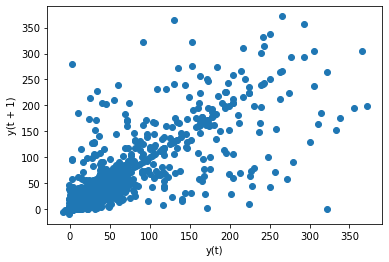

In [36]:
pd.plotting.lag_plot(absorptionDF, lag=1)

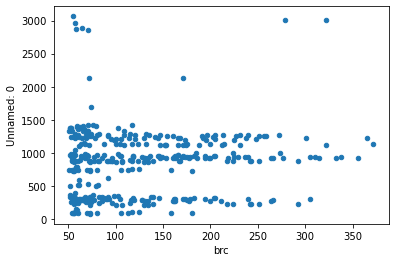

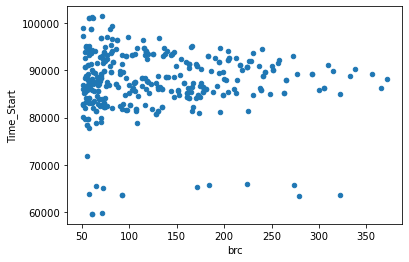

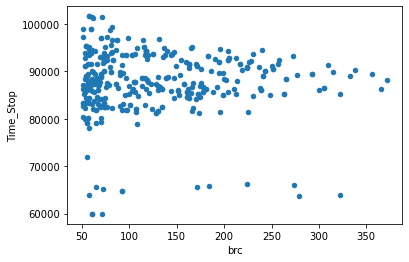

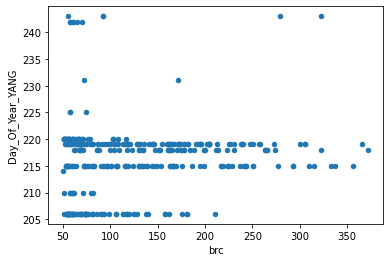

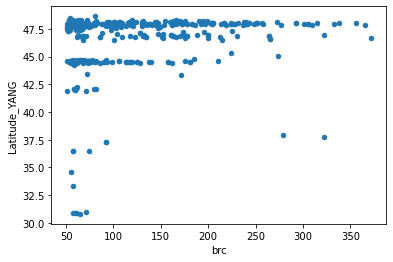

...

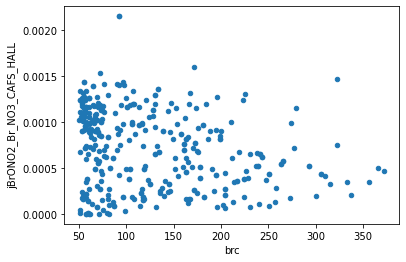

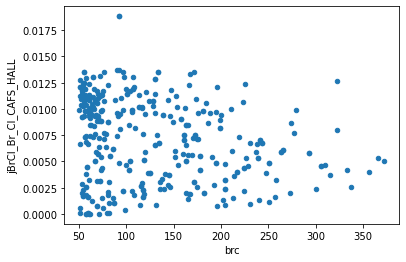

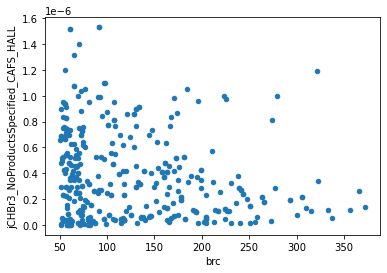

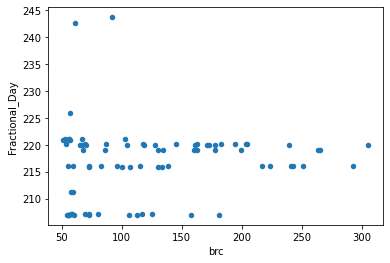

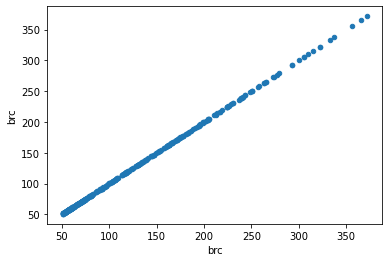

In [43]:
altDF = df[df['brc'] > 50]

for i in altDF:
    altDF.plot(x='brc', y=i, kind='scatter')

In [11]:
for i in df:
    if 'SCHWARZ' in i:
        print(i)

Smoke_flag_SCHWARZ
transect_type_SCHWARZ
Julian_date_SCHWARZ
fire_id_SCHWARZ
Background_flag_SCHWARZ
transect_smoke_age_SCHWARZ
transect_smoke_MCE_SCHWARZ
transect_number_SCHWARZ
transect_plume_number_SCHWARZ
transect_mce_ODR_SCHWARZ
transect_mce_odr_chisq_SCHWARZ
fire_distance_estimate_SCHWARZ
BC_mass_90_550_nm_SCHWARZ
BC_Dilution_Flag_SCHWARZ
